<u>References:</u><br>
(1) https://www.datacamp.com/tutorial/pytorch-cnn-tutorial <br>
(2) https://www.datacamp.com/tutorial/convolutional-neural-networks-python <br>
(3) https://www.chishiki-ai.org/cnn-course/part2-building-cnn-pytorch-solution.html <br>
(4) https://medium.com/biased-algorithms/a-practical-guide-to-implementing-early-stopping-in-pytorch-for-model-training-99a7cbd46e9d

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.metrics import roc_curve, auc, roc_auc_score, RocCurveDisplay, precision_recall_curve, \
accuracy_score, balanced_accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, ConfusionMatrixDisplay

import torch
from torch import optim
from torch import nn
from torch.utils.data import DataLoader
import torchvision
import torch.nn.functional as F
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torchsummary import summary

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
input_fpath = '/content/drive/MyDrive/Google AI Studio/chest_xray_resized_new'
output_fpath = '/content/drive/MyDrive/Google AI Studio/model_output'

In [ ]:
def target_transform(x):
    return x

def load_datasets(train_path, val_path, test_path):
    val_img_transform = transforms.Compose([transforms.ToTensor(), transforms.Grayscale(num_output_channels=1)]) # num_output_channels = 1 for gray-scale images
    train_img_transform = transforms.Compose([transforms.ToTensor(), transforms.Grayscale(num_output_channels=1)])
    train_dataset = datasets.ImageFolder(train_path, transform=train_img_transform, target_transform = target_transform)
    val_dataset = datasets.ImageFolder(val_path, transform=val_img_transform, target_transform = target_transform)
    test_dataset = datasets.ImageFolder(test_path, transform=val_img_transform, target_transform = target_transform)
    print(f"Train set size: {len(train_dataset)}, Validation set size: {len(val_dataset)}, Test set size: {len(test_dataset)}")
    return train_dataset, val_dataset, test_dataset

In [ ]:
# load all datasets
train_set, val_set, test_set = load_datasets(input_fpath + "/train", input_fpath + "/val", input_fpath + "/test")

Train set size: 4184, Validation set size: 1048, Test set size: 624


In [ ]:
# response variable class labels
print(train_set.class_to_idx)
print(val_set.class_to_idx)
print(test_set.class_to_idx)

{'NORMAL': 0, 'PNEUMONIA': 1}
{'NORMAL': 0, 'PNEUMONIA': 1}
{'NORMAL': 0, 'PNEUMONIA': 1}


In [ ]:
def construct_dataloaders(train_set, val_set, test_set, batch_size, shuffle=True, num_workers=0, pin_memory=False):
    train_dataloader = torch.utils.data.DataLoader(train_set, batch_size, shuffle, num_workers=num_workers, pin_memory=pin_memory)
    val_dataloader = torch.utils.data.DataLoader(val_set, batch_size, shuffle=False, num_workers=num_workers, pin_memory=pin_memory)
    test_dataloader = torch.utils.data.DataLoader(test_set, batch_size, shuffle=False, num_workers=num_workers, pin_memory=pin_memory)
    return train_dataloader, val_dataloader, test_dataloader

In [ ]:
# specify data loaders for CNN workflow
batch_size = 60
# It's recommended to set num_workers to 0 for debugging in notebooks.
# For faster training, consider setting it to a value like os.cpu_count() or a reasonable number for your system (e.g., 2 or 4).
# pin_memory=True is beneficial when moving data to GPU.
import os
num_workers = os.cpu_count() // 2 if os.cpu_count() else 0 # Use half of CPU cores, or 0 if not available
train_dataloader, val_dataloader, test_dataloader = construct_dataloaders(train_set, val_set, test_set, batch_size, True, num_workers=num_workers, pin_memory=True)

In [ ]:
# device for running CNN model (GPU or CPU)
device = "cuda" if torch.cuda.is_available() else "cpu"
print(device)

cuda


In [ ]:
class CNN(nn.Module):

   def __init__(self, in_channels, num_classes):
       """
       Building blocks of convolutional neural network.

       Parameters:
           * in_channels: Number of channels in the input image (for grayscale images, in_channels = 1)
           * num_classes: Number of classes to predict. In our problem, this parameter is either 2 or 3.
       """
       super(CNN, self).__init__()
       # 1st convolutional layer
       self.conv1 = nn.Conv2d(in_channels=in_channels, out_channels=32, kernel_size=3, padding=1)
       # Max pooling layer
       self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
       # 2nd convolutional layer
       self.conv2 = nn.Conv2d(in_channels=32, out_channels=32, kernel_size=3, padding=1)
       # 3rd convolutional layer
       self.conv3 = nn.Conv2d(in_channels=32, out_channels=32, kernel_size=3, padding=1)
       # 1st fully connected layer
       self.fc1 = nn.Linear(32 * 28 * 28, 128) # image "size" reduces from 224 x 224 to 28 x 28 after aftering max pooling 3 times in previous layers
       # 2nd fully connected layer (connected to the output layer)
       self.fc2 = nn.Linear(128, num_classes)

   def forward(self, x):
       """
       Define the forward pass of the convolutional neural network.
       Parameters:
           x: Input tensor.
       Returns:
           torch.Tensor
               The output tensor after passing through the network.
       """
       ## Convolution part: 3 convolutional layers
       x = F.relu(self.conv1(x))  # Apply first convolution and ReLU activation
       x = self.pool(x)           # Apply max pooling
       x = F.relu(self.conv2(x))  # Apply second convolution and ReLU activation
       x = self.pool(x)           # Apply max pooling
       x = F.relu(self.conv3(x))  # Apply third convolution and ReLU activation
       x = self.pool(x)           # Apply max pooling
       x = x.reshape(x.shape[0], -1)  # Flatten the tensor
       ## classifier part: two fully connected layers
       x = F.relu(self.fc1(x))    # Apply first fully connected layer and ReLU activation
       x = self.fc2(x)            # Apply second fully connected layer
       return x

In [ ]:
# Instantiate the CNN model
model = CNN(in_channels=1, num_classes=2).to(device) # For binary classification tasks, num_classes = 2
summary(model, input_size=(1, 224, 224),device=device)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 224, 224]             320
         MaxPool2d-2         [-1, 32, 112, 112]               0
            Conv2d-3         [-1, 32, 112, 112]           9,248
         MaxPool2d-4           [-1, 32, 56, 56]               0
            Conv2d-5           [-1, 32, 56, 56]           9,248
         MaxPool2d-6           [-1, 32, 28, 28]               0
            Linear-7                  [-1, 128]       3,211,392
            Linear-8                    [-1, 2]             258
Total params: 3,230,466
Trainable params: 3,230,466
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.19
Forward/backward pass size (MB): 20.10
Params size (MB): 12.32
Estimated Total Size (MB): 32.61
----------------------------------------------------------------


In [ ]:
# Define the loss function
criterion = nn.CrossEntropyLoss() # suitable for classification tasks

# Define the optimizer
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [ ]:
class EarlyStopping:

    def __init__(self, patience=5, delta=0.01, path=output_fpath + '/checkpoint_base_cnn_balanced.pt', verbose=True):
        '''
        An early stopping mechanism prevents CNN from overfitting the training data by monitering the change of the loss function on the validation set
        after each training epoch.
        '''
        self.patience = patience # how long to wait after the last best improvement before stopping
        self.delta = delta # the minimum change in validation loss that we care about
        self.path = path
        self.verbose = verbose
        self.best_loss = None
        self.no_improvement_count = 0

    def check_early_stop(self, val_loss):
        if self.best_loss is None or val_loss < self.best_loss - self.delta:
            self.best_loss = val_loss
            self.no_improvement_count = 0
            # Save checkpoint if improvement observed
            torch.save(model.state_dict(), self.path)
            if self.verbose:
                print(f"Model improved; checkpoint saved at loss {val_loss:.4f}")
        else:
            self.no_improvement_count += 1
            if self.no_improvement_count >= self.patience:
                print("Early stopping triggered.")
                return True  # Signal to stop training
        return False

In [ ]:
# Instantiate an early stopping controller
early_stopping = EarlyStopping(patience=5, delta=0.01)

In [ ]:
num_epochs = 100
train_losses, val_losses = [], []

for epoch in range(num_epochs):
    # training within each epoch
    model.train() # Set model to training mode
    train_loss = 0.0
    print("Epoch {} Training...".format(epoch))
    for batch_idx, (data, target) in enumerate(train_dataloader):
        # print("Batch", batch_idx) # Removed for performance
        data = data.to(device)
        target = target.to(device)
        optimizer.zero_grad() # Reset parameter gradients to zero
        output = model(data) # Forward pass
        loss = criterion(output, target) # Compute the loss function for the batch
        loss.backward() # Back propogation
        optimizer.step() # Update weights
        train_loss += loss.item()
    train_losses.append(train_loss / len(train_dataloader)) # Loss function averaged over all batches

    # using validation set to monitor the model performance after each training epoch
    model.eval() # Set model to evaluation mode
    val_loss = 0.0
    print("Epoch {} Evaluation...".format(epoch))
    with torch.no_grad(): # This method disables the gradient calculation which reduces the memory consumption for computations
        for data, target in val_dataloader:
            data = data.to(device)
            target = target.to(device)
            output = model(data) # Forward pass
            loss = criterion(output, target) # Compute the loss function for the batch
            val_loss += loss.item()
    val_loss /= len(val_dataloader)
    val_losses.append(val_loss) # Loss function averaged over all batches

    # Early stopping check
    if early_stopping.check_early_stop(val_loss):
        print(f"Stopping training at epoch {epoch+1}")
        break

Epoch 0 Training...
Epoch 0 Evaluation...
Model improved; checkpoint saved at loss 0.1401
Epoch 1 Training...
Epoch 1 Evaluation...
Epoch 2 Training...
Epoch 2 Evaluation...
Model improved; checkpoint saved at loss 0.0835
Epoch 3 Training...
Epoch 3 Evaluation...
Epoch 4 Training...
Epoch 4 Evaluation...
Model improved; checkpoint saved at loss 0.0670
Epoch 5 Training...
Epoch 5 Evaluation...
Epoch 6 Training...
Epoch 6 Evaluation...
Epoch 7 Training...
Epoch 7 Evaluation...
Epoch 8 Training...
Epoch 8 Evaluation...
Epoch 9 Training...
Epoch 9 Evaluation...
Early stopping triggered.
Stopping training at epoch 10


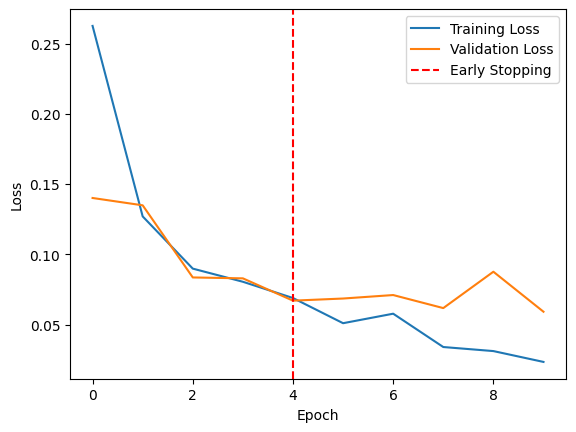

In [ ]:
# Load best model checkpoint after early stopping
model.load_state_dict(torch.load(early_stopping.path))

# Final loss vs. epoch plot for both training and validation sets
epoch_list = np.arange(0, len(val_losses))
plt.plot(epoch_list, train_losses, label="Training Loss")
plt.plot(epoch_list, val_losses, label="Validation Loss")
plt.axvline(x=len(val_losses)-early_stopping.no_improvement_count-1, color='r', linestyle='--', label="Early Stopping")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [ ]:
# Iterate over the test set batches to generate predicted probabilities for PNEUMONIA
model.eval() # Set model to evaluation mode
preds_list = []
y_list = []
with torch.no_grad(): # disabling the gradient calculation when evaluating model performance on test set
   for images, labels in test_dataloader:
       images = images.to(device) # Move images to the same device as the model
       # Get predicted probabilities for test data batch
       outputs = model(images)
       # Convert the raw values in the output neurons to predicted probabilities:
       # dim is the dimension along which softmax will be computed. In this case, dim = 0 corresponds to indices for observations in the batch, dim = 1 corresponds to the raw output values of each observation
       preds = F.softmax(outputs, dim=1)
       preds_list.append(preds)
       y_list.append(labels)
pred_probabilities = torch.cat(preds_list, dim = 0).cpu().numpy()[:,1]
actual_y = torch.cat(y_list, dim = 0).cpu().numpy()

AUC = 0.9635


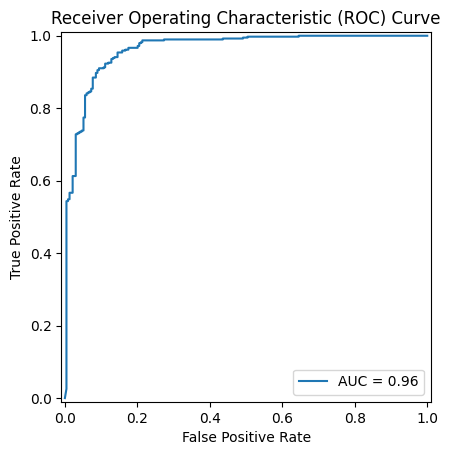

In [ ]:
# ROC-AUC on test set
print("AUC =", round(roc_auc_score(actual_y, pred_probabilities), 4))
fpr, tpr, thresholds = roc_curve(actual_y, pred_probabilities)
roc_auc = auc(fpr, tpr)
display = RocCurveDisplay(tpr = tpr, fpr = fpr, roc_auc = roc_auc)
display.plot()
plt.title("Receiver Operating Characteristic (ROC) Curve")
plt.show()

In [ ]:
# Tune the threshold via optimizing the F1 score of the minority class (using the validation set: balancing the tradeoff between precision and recall for the NORMAL class)
## Generate predicted probabilities for PNEUMONIA
model.eval() # Set model to evaluation mode
preds_list = []
y_list = []
with torch.no_grad():
   for images, labels in val_dataloader:
       images = images.to(device) # Move images to the same device as the model
       # Get predicted probabilities for test data batch
       outputs = model(images)
       preds = F.softmax(outputs, dim=1)
       preds_list.append(preds)
       y_list.append(labels)
pred_probabilities_val = torch.cat(preds_list, dim = 0).cpu().numpy()[:,1]
actual_y_val = torch.cat(y_list, dim = 0).cpu().numpy()
## Get precision/recall/threshold values
precision, recall, thresholds = precision_recall_curve(1 - actual_y_val, 1 - pred_probabilities_val)
## Calculate F1 scores
f1_scores = 2 * recall * precision / (recall + precision)
## Find the threshold for the highest F1 score
best_idx = np.argmax(f1_scores)
best_threshold = 1 - thresholds[best_idx]
print("Best threshold =", best_threshold)

Best threshold = 0.46641612


Accuracy = 0.867
Balanced accuracy = 0.8261
F1 score (PNEUMONIA) = 0.9029
True positive rate (sensitivity, recall) = 0.9897
True negative rate (specificity) = 0.6624
Positive predictive value (precision) = 0.8301
Negative predictive value = 0.9748
Confusion matrix:


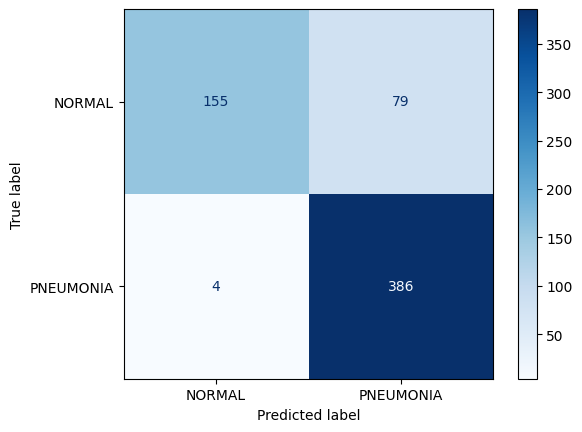

In [ ]:
# Other evaluation metrics that depend on threshold:
pred_y = (pred_probabilities > best_threshold).astype(int)
print("Accuracy =", round(accuracy_score(actual_y, pred_y),4))
print("Balanced accuracy =", round(balanced_accuracy_score(actual_y, pred_y),4))
print("F1 score (PNEUMONIA) =", round(f1_score(actual_y, pred_y),4))
print("True positive rate (sensitivity, recall) =", round(recall_score(actual_y, pred_y),4))
print("True negative rate (specificity) =", round(recall_score(actual_y, pred_y, pos_label=0),4))
print("Positive predictive value (precision) =", round(precision_score(actual_y, pred_y),4))
print("Negative predictive value =", round(precision_score(actual_y, pred_y, pos_label=0),4))
print("Confusion matrix:")
cm = confusion_matrix(actual_y, pred_y, labels=[0,1])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['NORMAL','PNEUMONIA'])
disp.plot(cmap=plt.cm.Blues)
plt.show()

In [ ]:
# class MyDataset(Dataset):
#     def __getitem__(self, index):
#         data, target = self.data[index], self.targets[index]
#         # Explicitly return the index along with data
#         return data, target, index

# # Usage in training loop
# for batch_idx, (data, target, sample_indices) in enumerate(dataloader):
#     print(f"Indices in this batch: {sample_indices}")

In [ ]:
import os
import numpy as np

# Create the output directory if it doesn't exist
os.makedirs(output_fpath, exist_ok=True)

# Save the results needed for Grad-CAM and further analysis
np.save(os.path.join(output_fpath, 'actual_y.npy'), actual_y)
np.save(os.path.join(output_fpath, 'pred_probabilities.npy'), pred_probabilities)
np.save(os.path.join(output_fpath, 'pred_y.npy'), pred_y)
np.save(os.path.join(output_fpath, 'best_threshold.npy'), best_threshold)

print(f"All results saved to {output_fpath}")

All results saved to /content/drive/MyDrive/Google AI Studio/model_output


## Grad-CAM


In [ ]:
import cv2
from PIL import Image
import matplotlib.pyplot as plt

class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None

        # Register hooks
        self.target_layer.register_forward_hook(self._save_activations)
        self.target_layer.register_backward_hook(self._save_gradients)

    def _save_activations(self, module, input, output):
        self.activations = output

    def _save_gradients(self, module, grad_input, grad_output):
        self.gradients = grad_output[0]

    def __call__(self, input_tensor, target_category=None):
        self.model.eval()
        # Forward pass
        output = self.model(input_tensor)

        if target_category is None:
            # Get the category with the highest score
            target_category = output.argmax(dim=1).item()

        # Zero gradients
        self.model.zero_grad()

        # Backward pass for the target category
        one_hot_output = torch.zeros_like(output)
        one_hot_output[0][target_category] = 1
        output.backward(gradient=one_hot_output, retain_graph=True)

        # Get gradients and activations
        gradients = self.gradients.cpu().data.numpy()[0]
        activations = self.activations.cpu().data.numpy()[0]

        # Pool the gradients across the channels to get weights
        weights = np.mean(gradients, axis=(1, 2))

        # Compute Grad-CAM heatmap
        cam = np.zeros(activations.shape[1:], dtype=np.float32)
        for i, w in enumerate(weights):
            cam += w * activations[i]

        # Apply ReLU to the CAM
        cam = np.maximum(cam, 0)
        cam = cv2.resize(cam, (input_tensor.shape[2], input_tensor.shape[3])) # Resize to original image size
        cam = cam - np.min(cam)
        cam = cam / np.max(cam) # Normalize to [0, 1]
        return cam

def visualize_cam(original_img, heatmap, alpha=0.5):
    # Convert original_img to 3 channels if it's grayscale for overlay
    if original_img.mode == 'L': # Grayscale
        original_img_rgb = original_img.convert('RGB')
    else:
        original_img_rgb = original_img

    # Convert original image to float32 and normalize to [0, 1]
    img_np = np.array(original_img_rgb).astype(np.float32) / 255.0
    img_bgr = cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR) # img_bgr is now float32, range [0, 1]

    # Process heatmap: apply colormap, convert to float32 and normalize to [0, 1]
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    heatmap_colored = np.float32(heatmap_colored) / 255 # heatmap_colored is float32, range [0, 1]

    # Overlay heatmap on original image using addWeighted
    cam_overlay = cv2.addWeighted(img_bgr, alpha, heatmap_colored, 1 - alpha, 0)

    # Convert the overlay result back to uint8 [0, 255] for display
    cam_overlay_display = np.uint8(255 * cam_overlay)
    cam_overlay_display = cv2.cvtColor(cam_overlay_display, cv2.COLOR_BGR2RGB)

    return Image.fromarray(cam_overlay_display)

/usr/local/lib/python3.12/dist-packages/torch/nn/modules/module.py:1867: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


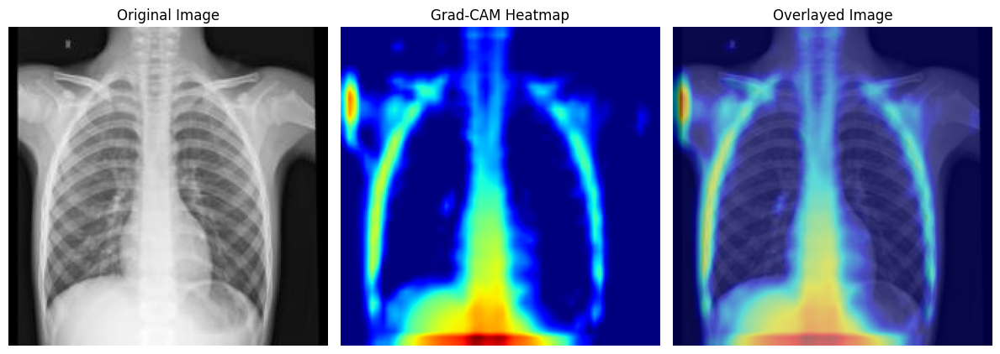

In [ ]:
# Instantiate Grad-CAM
# We'll use the last convolutional layer (conv3) for Grad-CAM
grad_cam = GradCAM(model, model.conv3)

# Get one image from the test set
# Ensure the image and label are on the correct device
image, label = test_set[0]
original_image_pil = transforms.ToPILImage()(image) # Convert tensor to PIL Image for visualization

input_tensor = image.unsqueeze(0).to(device) # Add batch dimension and move to device

# Generate Grad-CAM heatmap
heatmap = grad_cam(input_tensor, target_category=label)

# Visualize
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(original_image_pil, cmap='gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(heatmap, cmap='jet')
plt.title("Grad-CAM Heatmap")
plt.axis('off')

overlay_image = visualize_cam(original_image_pil, heatmap)
plt.subplot(1, 3, 3)
plt.imshow(overlay_image)
plt.title("Overlayed Image")
plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
false_positives_indices = np.where((actual_y == 0) & (pred_y == 1))[0]
true_negatives_indices = np.where((actual_y == 0) & (pred_y == 0))[0]

np.random.seed(42) # For reproducibility
selected_false_positives = np.random.choice(false_positives_indices, min(10, len(false_positives_indices)), replace=False)
selected_true_negatives = np.random.choice(true_negatives_indices, min(10, len(true_negatives_indices)), replace=False)

print(f"Found {len(false_positives_indices)} False Positives (Actual Normal, Predicted Pneumonia).")
print(f"Found {len(true_negatives_indices)} True Negatives (Actual Normal, Predicted Normal).")
print("Displaying up to 10 random samples from each category.")

Found 79 False Positives (Actual Normal, Predicted Pneumonia).
Found 155 True Negatives (Actual Normal, Predicted Normal).
Displaying up to 10 random samples from each category.


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/module.py:1867: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


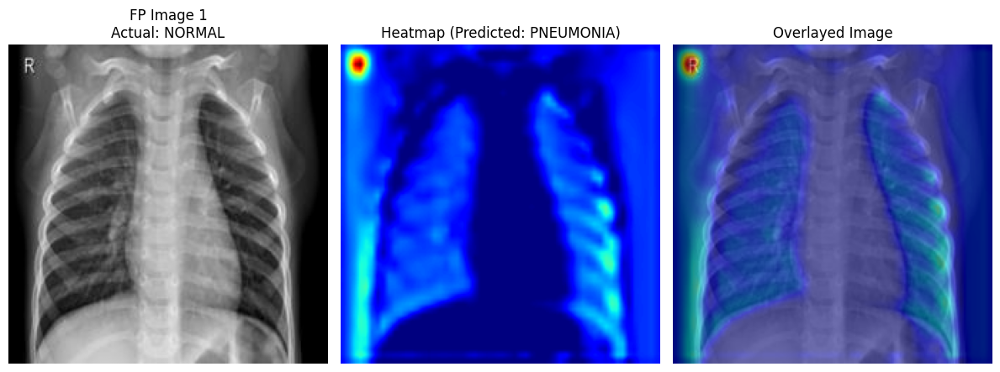

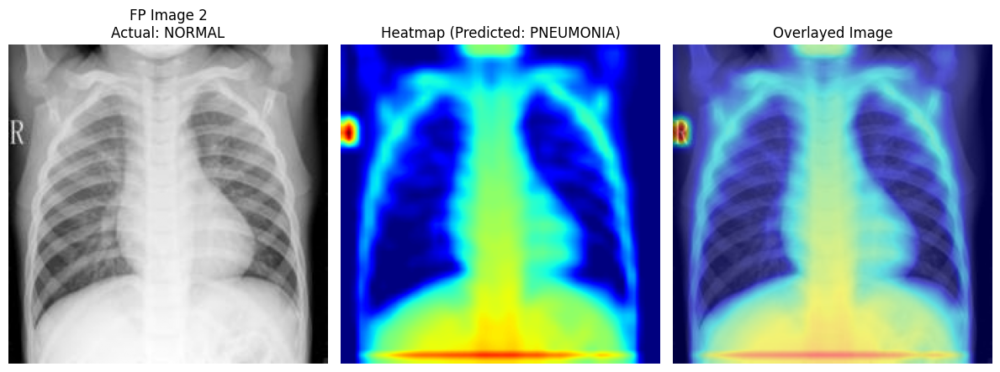

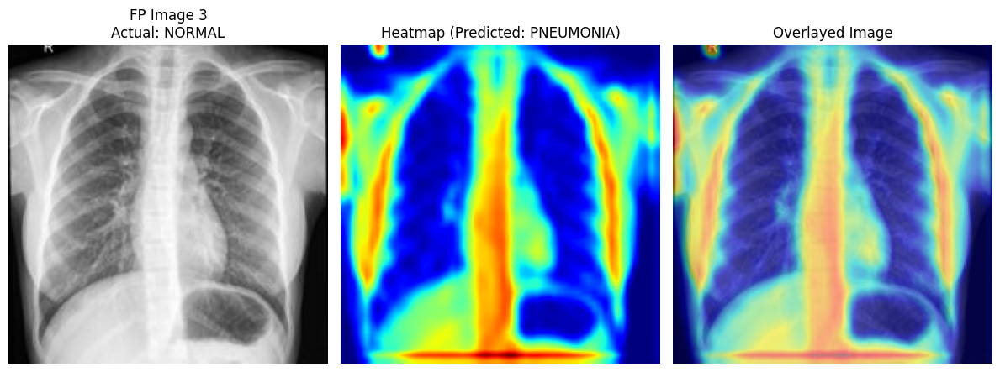

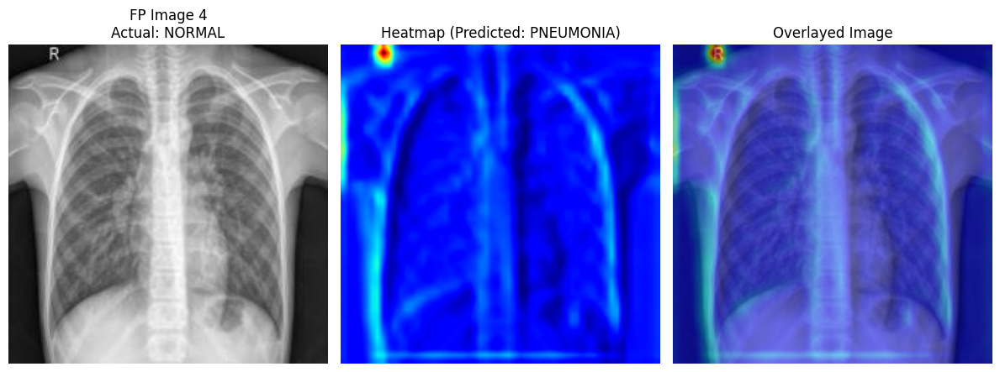

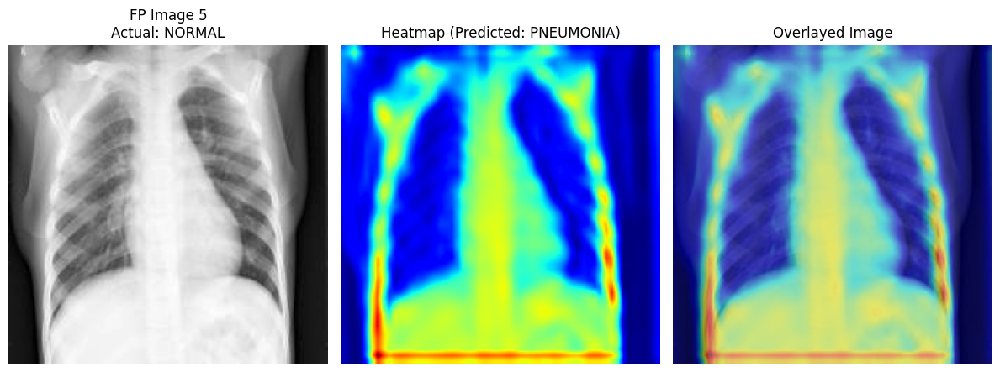

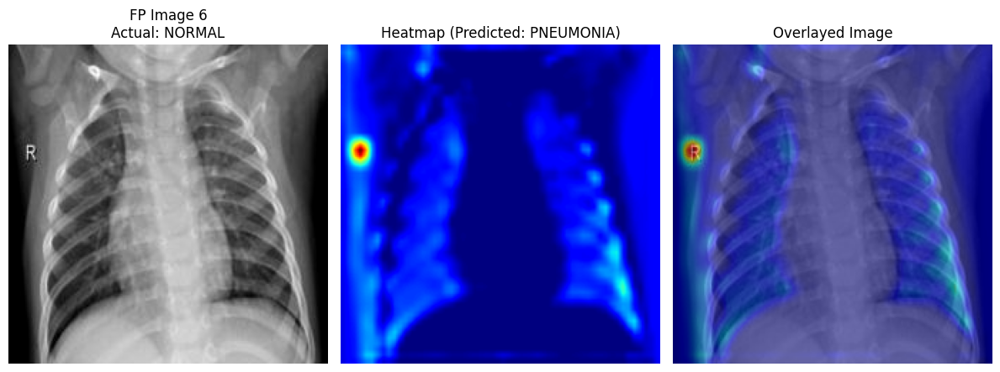

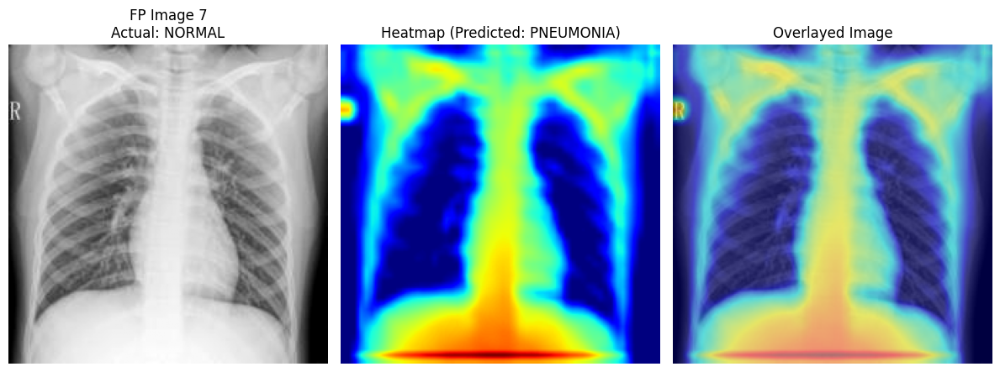

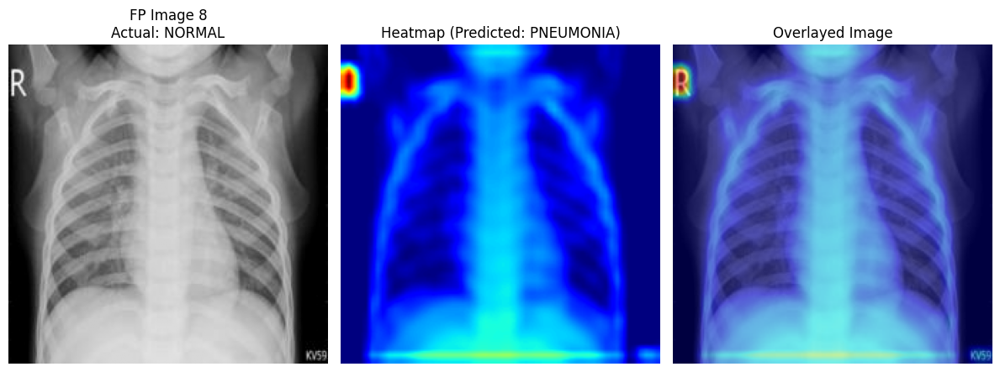

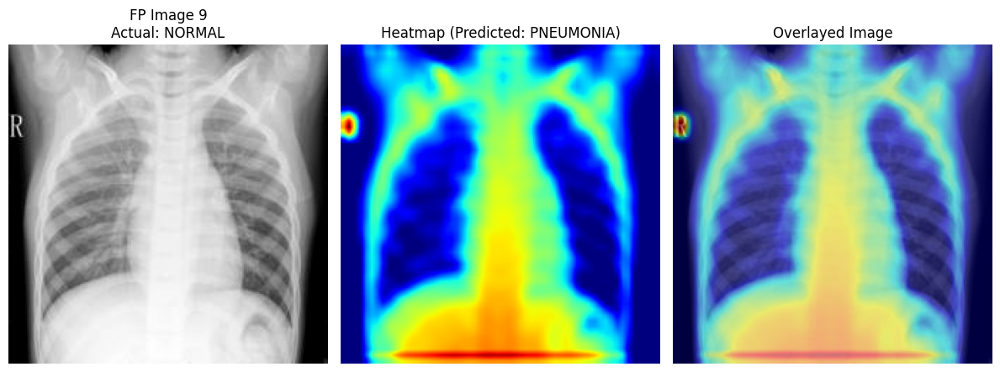

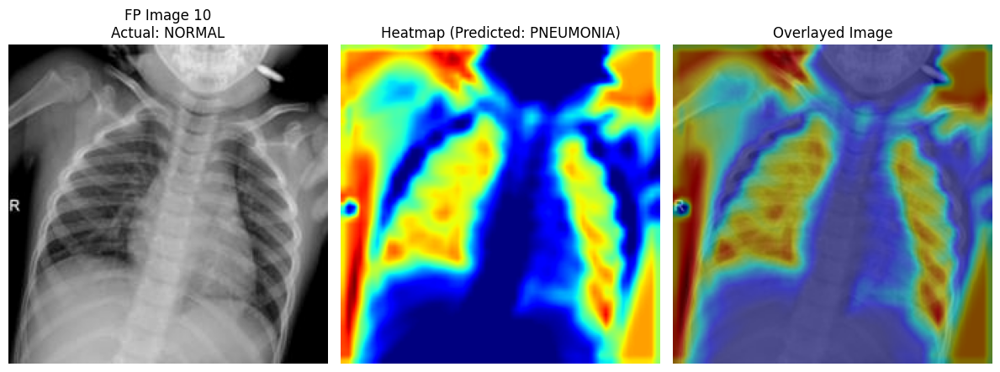

In [ ]:
for i, idx in enumerate(selected_false_positives):
    image, label = test_set[idx]
    original_image_pil = transforms.ToPILImage()(image)
    input_tensor = image.unsqueeze(0).to(device)

    # The predicted label for false positives is 1 (Pneumonia)
    heatmap = grad_cam(input_tensor, target_category=1) # Target Grad-CAM for the predicted class (Pneumonia)

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(original_image_pil, cmap='gray')
    plt.title(f"FP Image {i+1}\nActual: NORMAL")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(heatmap, cmap='jet')
    plt.title(f"Heatmap (Predicted: PNEUMONIA)")
    plt.axis('off')

    overlay_image = visualize_cam(original_image_pil, heatmap)
    plt.subplot(1, 3, 3)
    plt.imshow(overlay_image)
    plt.title("Overlayed Image")
    plt.axis('off')
    plt.tight_layout()
    plt.show()

True Negatives: Actual Normal, Predicted Normal

In [ ]:
true_positives_indices = np.where((actual_y == 1) & (pred_y == 1))[0]
false_negatives_indices = np.where((actual_y == 1) & (pred_y == 0))[0]

np.random.seed(42) # For reproducibility
selected_true_positives = np.random.choice(true_positives_indices, min(10, len(true_positives_indices)), replace=False)
selected_false_negatives = np.random.choice(false_negatives_indices, min(10, len(false_negatives_indices)), replace=False)

print(f"Found {len(true_positives_indices)} True Positives (Actual Pneumonia, Predicted Pneumonia).")
print(f"Found {len(false_negatives_indices)} False Negatives (Actual Pneumonia, Predicted Normal).")
print("Displaying up to 10 random samples from each category.")

Found 386 True Positives (Actual Pneumonia, Predicted Pneumonia).
Found 4 False Negatives (Actual Pneumonia, Predicted Normal).
Displaying up to 10 random samples from each category.


True Positives: Actual Pneumonia, Predicted Pneumonia

/usr/local/lib/python3.12/dist-packages/torch/nn/modules/module.py:1867: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


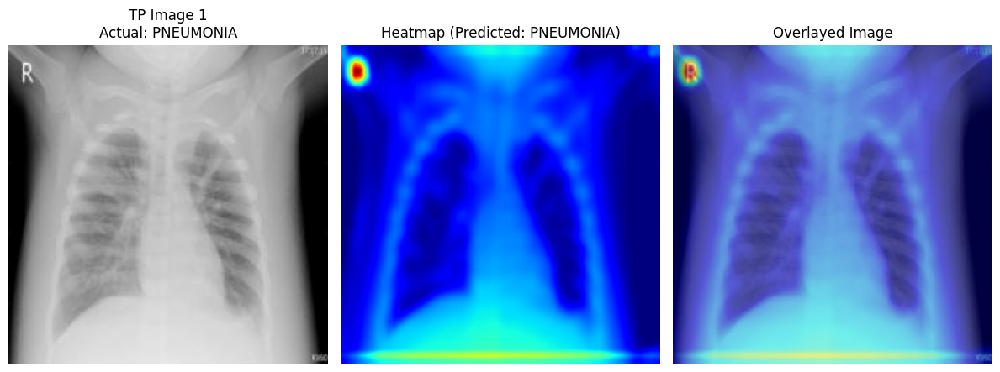

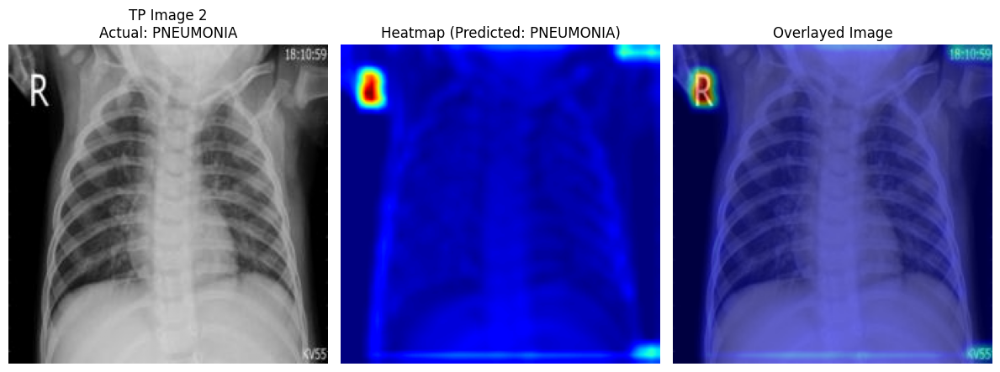

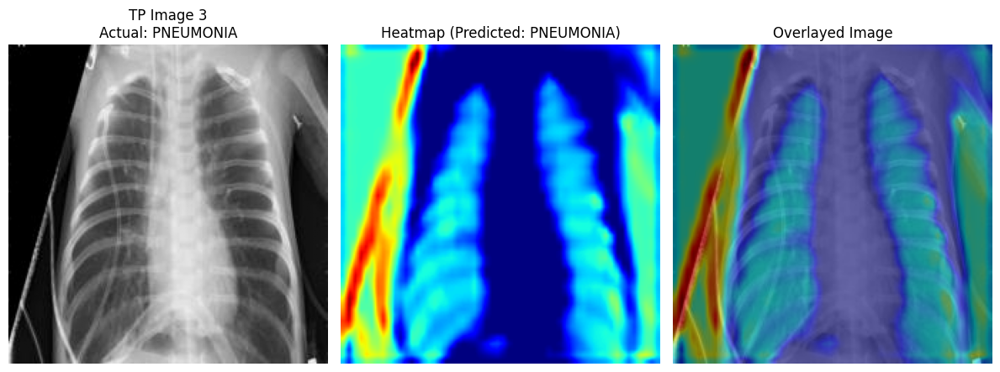

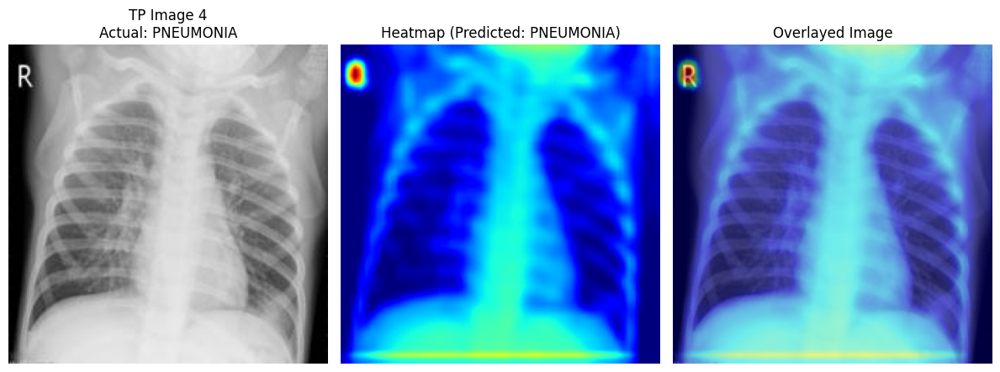

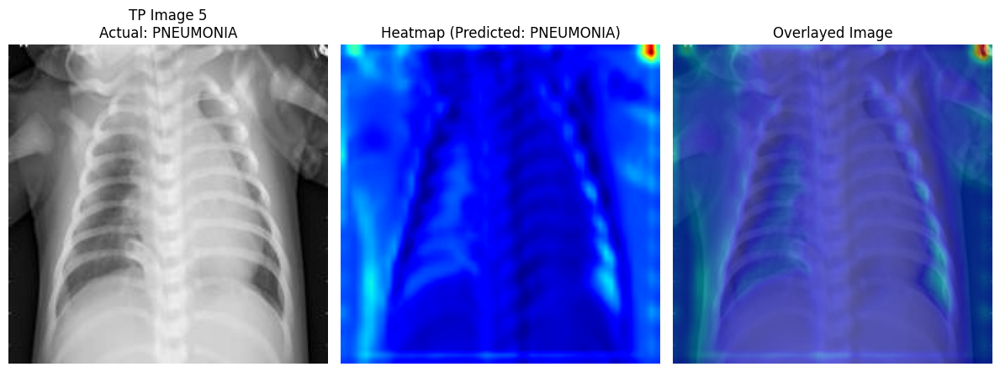

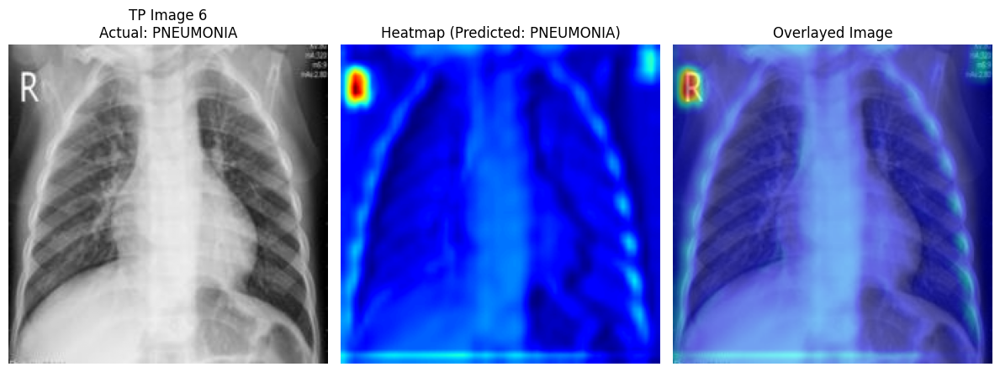

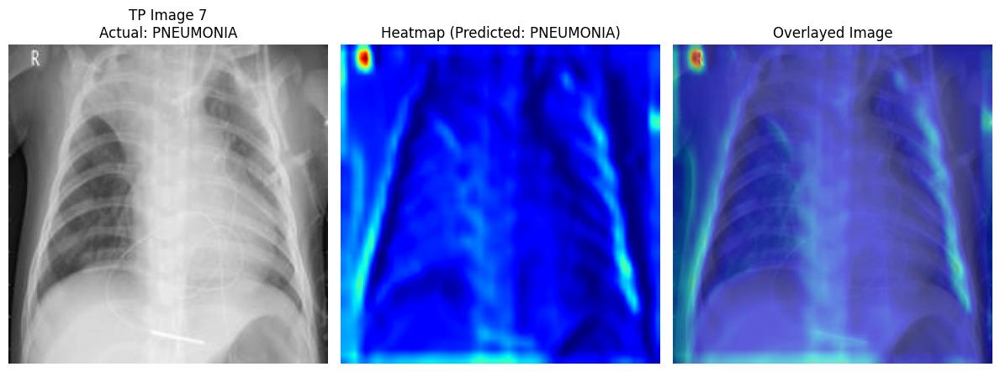

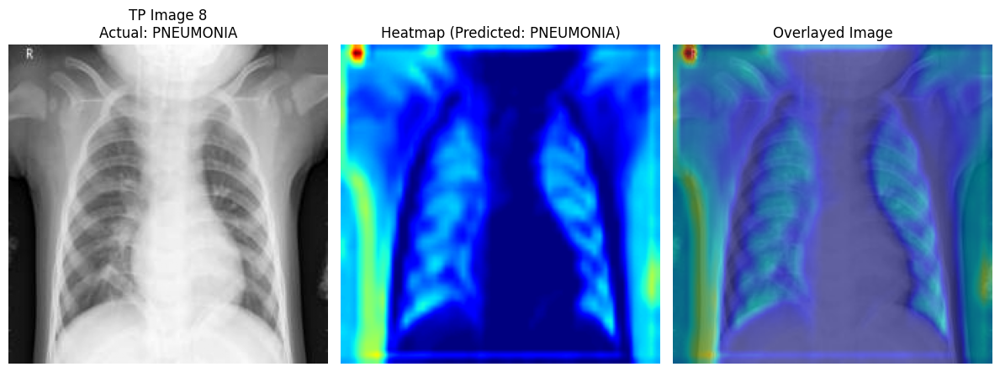

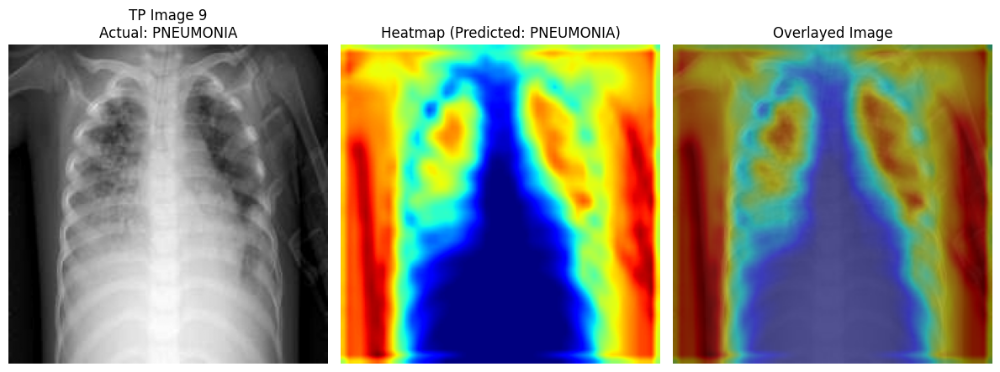

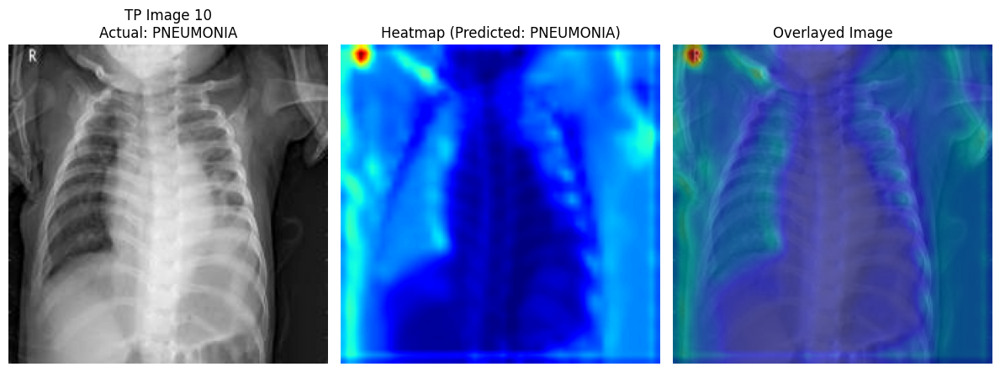

In [ ]:
for i, idx in enumerate(selected_true_positives):
    image, label = test_set[idx]
    original_image_pil = transforms.ToPILImage()(image)
    input_tensor = image.unsqueeze(0).to(device)

    # The predicted label for true positives is 1 (Pneumonia)
    heatmap = grad_cam(input_tensor, target_category=1) # Target Grad-CAM for the predicted class (Pneumonia)

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(original_image_pil, cmap='gray')
    plt.title(f"TP Image {i+1}\nActual: PNEUMONIA")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(heatmap, cmap='jet')
    plt.title(f"Heatmap (Predicted: PNEUMONIA)")
    plt.axis('off')

    overlay_image = visualize_cam(original_image_pil, heatmap)
    plt.subplot(1, 3, 3)
    plt.imshow(overlay_image)
    plt.title("Overlayed Image")
    plt.axis('off')
    plt.tight_layout()
    plt.show()

(False Negatives: Actual Pneumonia, Predicted Normal)

---



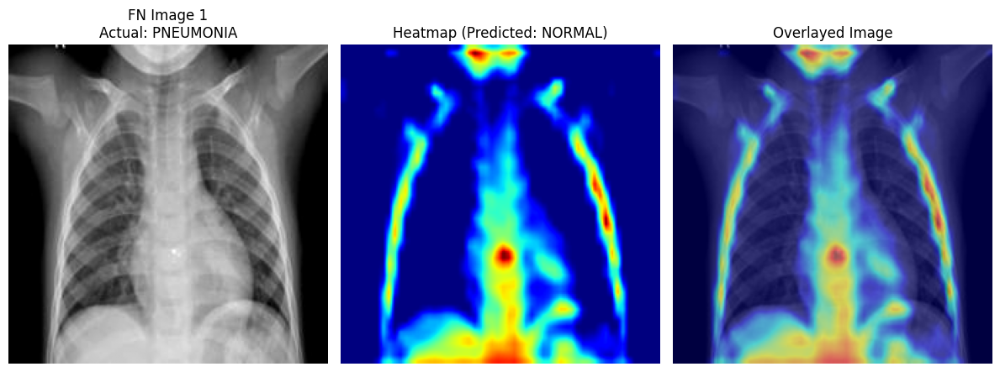

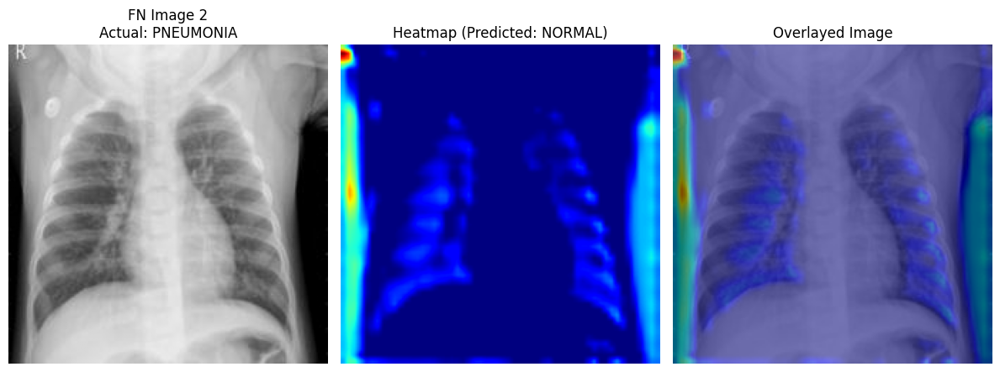

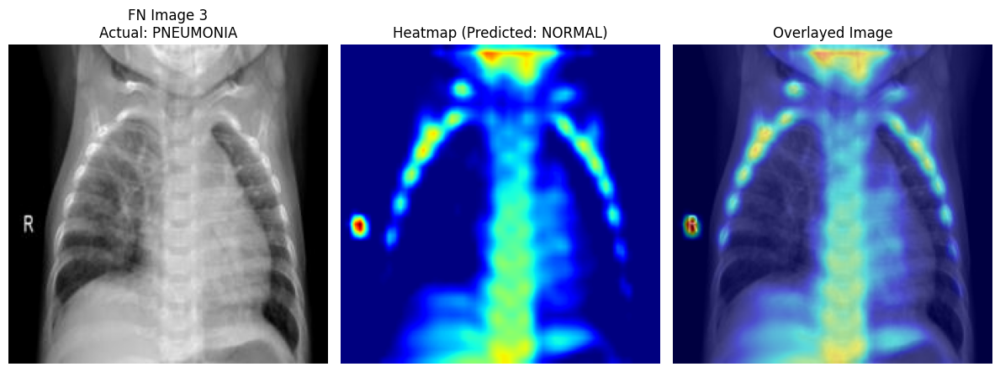

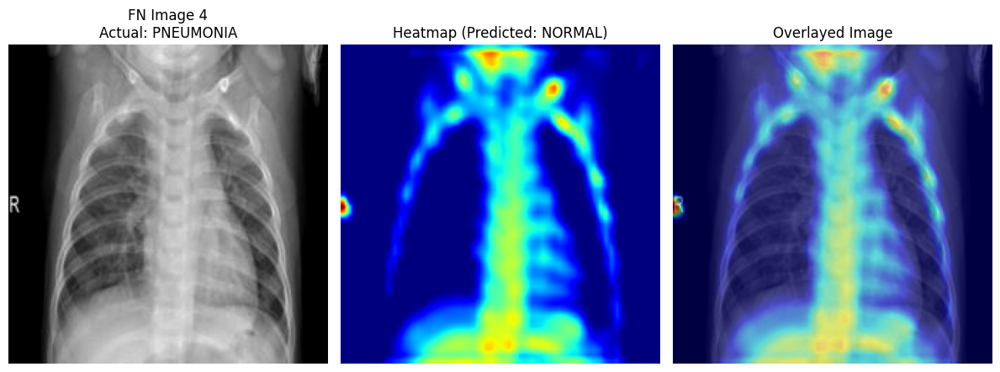

In [ ]:
for i, idx in enumerate(selected_false_negatives):
    image, label = test_set[idx]
    original_image_pil = transforms.ToPILImage()(image)
    input_tensor = image.unsqueeze(0).to(device)

    # The predicted label for false negatives is 0 (Normal)
    heatmap = grad_cam(input_tensor, target_category=0) # Target Grad-CAM for the predicted class (Normal)

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(original_image_pil, cmap='gray')
    plt.title(f"FN Image {i+1}\nActual: PNEUMONIA")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(heatmap, cmap='jet')
    plt.title(f"Heatmap (Predicted: NORMAL)")
    plt.axis('off')

    overlay_image = visualize_cam(original_image_pil, heatmap)
    plt.subplot(1, 3, 3)
    plt.imshow(overlay_image)
    plt.title("Overlayed Image")
    plt.axis('off')
    plt.tight_layout()
    plt.show()

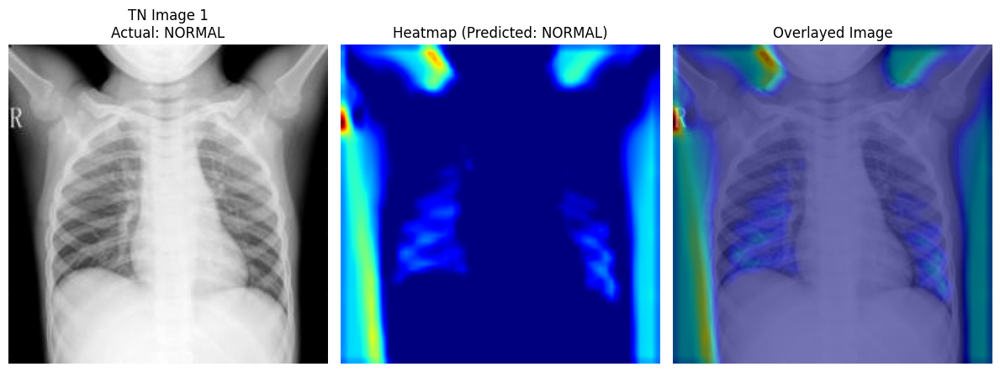

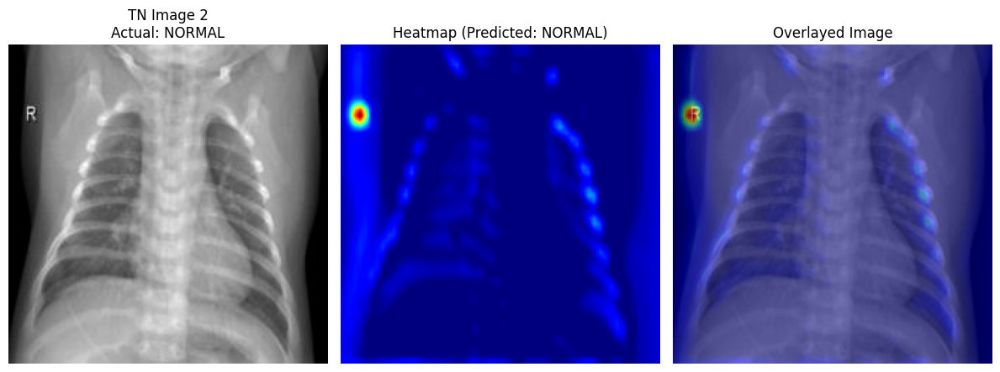

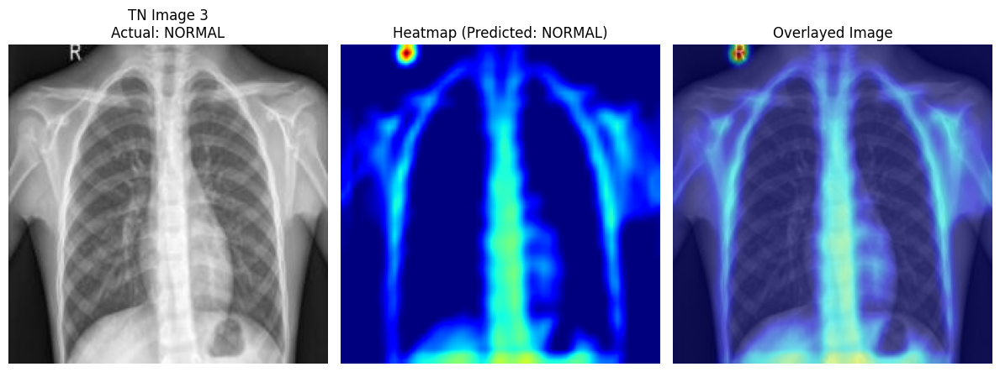

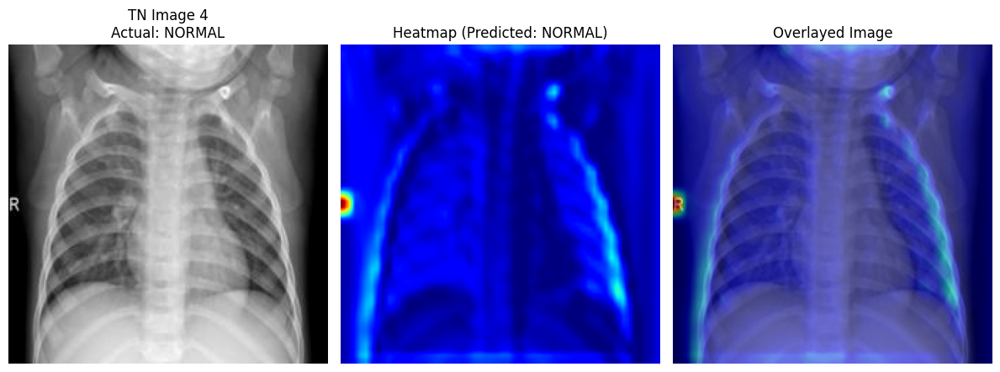

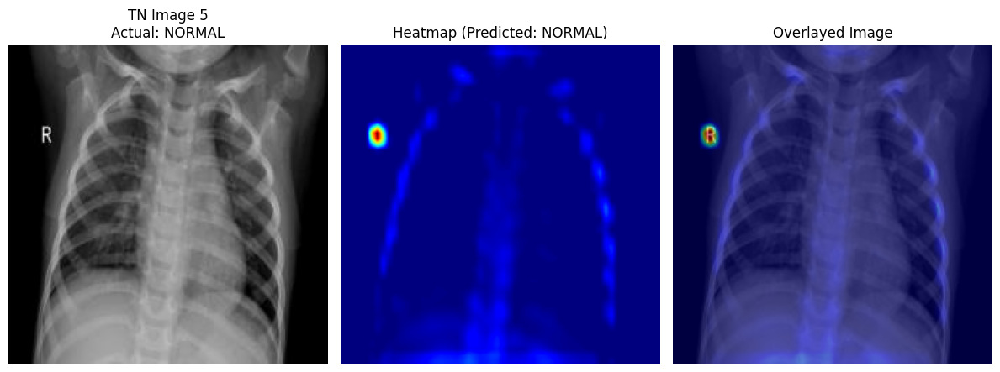

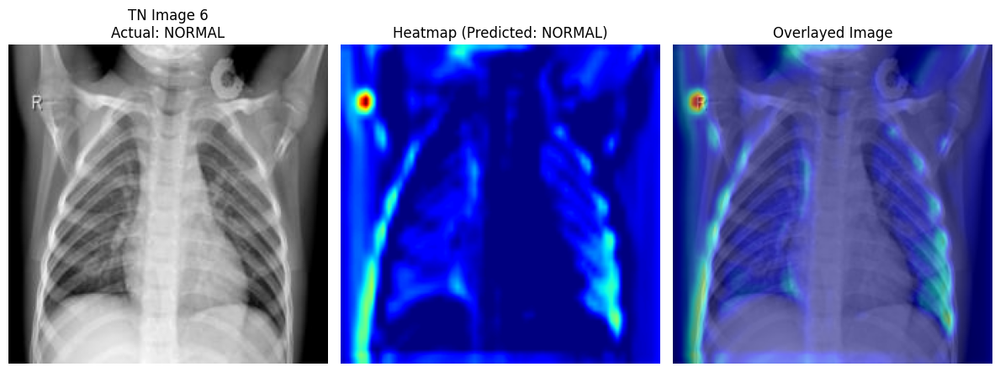

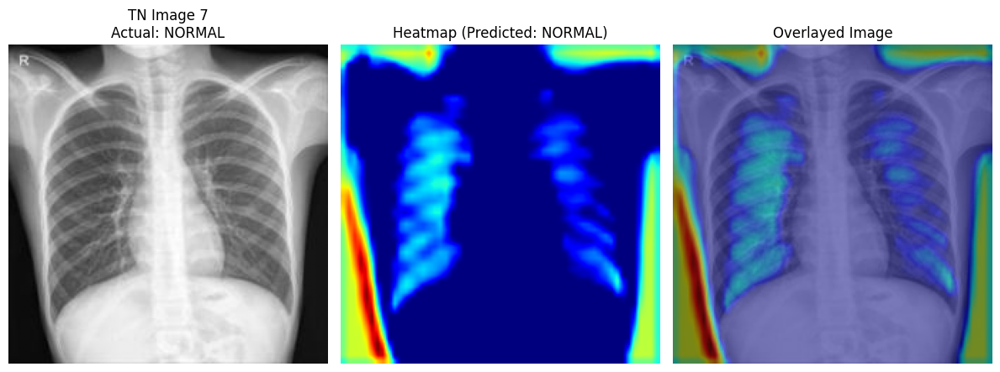

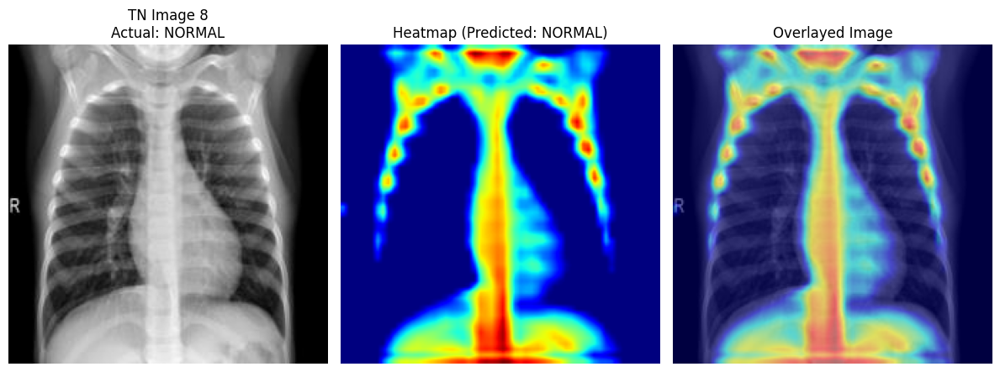

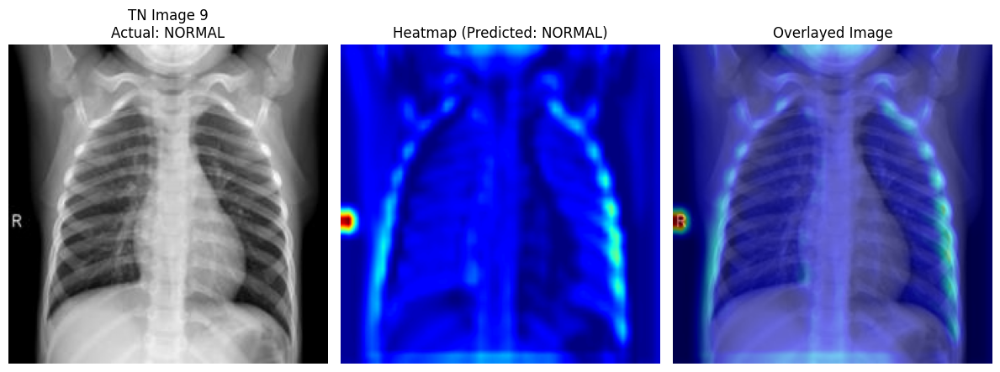

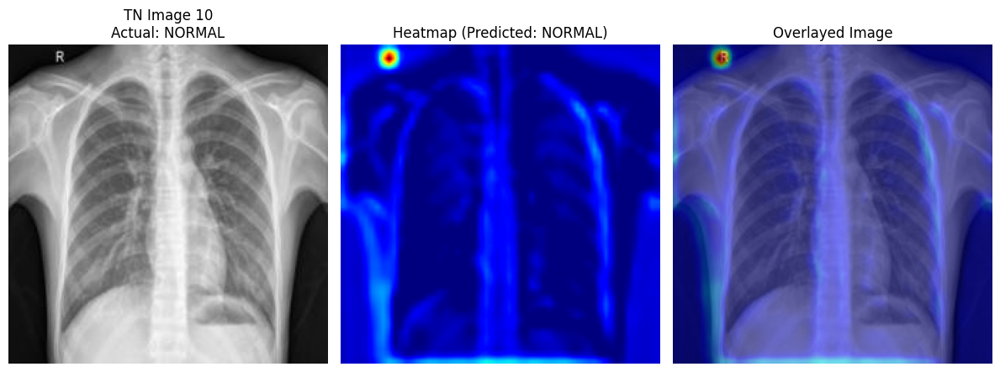

In [ ]:
for i, idx in enumerate(selected_true_negatives):
    image, label = test_set[idx]
    original_image_pil = transforms.ToPILImage()(image)
    input_tensor = image.unsqueeze(0).to(device)

    # The predicted label for true negatives is 0 (Normal)
    heatmap = grad_cam(input_tensor, target_category=0) # Target Grad-CAM for the predicted class (Normal)

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(original_image_pil, cmap='gray')
    plt.title(f"TN Image {i+1}\nActual: NORMAL")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(heatmap, cmap='jet')
    plt.title(f"Heatmap (Predicted: NORMAL)")
    plt.axis('off')

    overlay_image = visualize_cam(original_image_pil, heatmap)
    plt.subplot(1, 3, 3)
    plt.imshow(overlay_image)
    plt.title("Overlayed Image")
    plt.axis('off')
    plt.tight_layout()
    plt.show()